<a href="https://colab.research.google.com/github/wkweigel/NotebookExamples/blob/main/ActivityCliffAnalysis_PARP2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!python --version

Python 3.10.12


In [1]:
!pip install rdkit bokeh umap-learn global-chem==1.8.0 plotly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 26.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 6.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.1/119.1 kB 12.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 6.5 MB/s eta 0:00:00
  Created wheel for global-chem: filename=global_chem-1.8-py3-none-any.whl size=148929 sha256=ad97be49a3edec4c760ab2bdecbb64ef0a797a1b79ec7f4163aed96518d0033a
  Stored in directory: /root/.cache/pip/wheels/ba/6c/16/dc33cf98309405d359af05b6eedbf32160ad56d151019bde16
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86831 sha256=60414eb4a1f3f093c05fec9c0c8c0cfb35abae5880c619f6f58cde5bd3010adc
  Stored in directory: /root/.cache/pip/wheels/3a/70/07/428d2b58660a1a3b431db59b806a10da736612ebbc66c1bcc5
Successfully built global-chem umap-learn


**Cluster smiles data using umap for graphical activity cliff analysis**

---



In [2]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem, rdFMCS
from rdkit.Chem import Draw
from rdkit.Chem.rdFMCS import FindMCS
import umap
import numpy as np
import matplotlib.pyplot as plt
from bokeh.io import output_notebook
from sklearn.cluster import KMeans
from bokeh.plotting import figure, ColumnDataSource, show
from bokeh.models import HoverTool
from bokeh.transform import linear_cmap
from bokeh.palettes import Viridis256, Turbo256, Inferno256

Perform clustering and dimensionality reduction using umap

In [3]:

# Specify a csv containing "Smiles" and "IC50" data and the number of umap clusters to produce
dataset_file='https://raw.githubusercontent.com/wkweigel/NotebookExamples/main/Datasets/ChEMBL%20PARP2%20Cpds.csv'
n_clusters = 20

# Load the dataset with smiles and IC50 values into a pandas DataFrame
data_df = pd.read_csv(dataset_file)

#Remove duplicate smiles entries (Common in ChEMBL datasets)
before_rows = data_df.shape[0]
data_df.drop_duplicates("Smiles",inplace=True)
after_rows = data_df.shape[0]
print(f"{before_rows} rows reduced to {after_rows} rows")

# Define a function to convert smiles to mols and fingerprints
molecules=[]
fingerprints=[]
def smiles_to_mol_and_fp(smiles):
    mol = Chem.MolFromSmiles(smiles)
    molecules.append(mol)
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=2048)
    fingerprints.append(fp)

# Convert smiles to mols and fingerprints and add them to the data df
for smiles in data_df['Smiles']:
    smiles_to_mol_and_fp(smiles)

data_df['Mol'] = molecules
data_df['Mol_Fingerprint'] = fingerprints

# Perform UMAP dimensionality reduction of the fingerprints
reducer = umap.UMAP(n_components=2)
umap_result = reducer.fit_transform(fingerprints)

# Perform K-Means clustering on the umap results
kmeans = KMeans(n_clusters=n_clusters)
kmeans_labels = kmeans.fit_predict(umap_result)

# Create a DataFrame with UMAP results and K-Means clusters
umap_df = pd.DataFrame({'UMAP1': umap_result[:, 0],
                        'UMAP2': umap_result[:, 1],
                        'Cluster': kmeans_labels,
                        'Smiles': data_df['Smiles'],
                        'Mol': data_df['Mol'],
                        'Mol_Fingerprint':data_df['Mol_Fingerprint'],
                        "ID" : data_df['Molecule ChEMBL ID'],
                        "IC50" : data_df['IC50']})

# Calculate and create a column for pIC50 values
umap_df['pIC50'] = -np.log10([x * 1e-6 for x in data_df['IC50'].values])
pIC50_labels=umap_df['pIC50']
umap_df['mean pIC50']=np.nan
data_df['pIC50']=pIC50_labels

# Calculate the mean pIC50 and maximum common substructure (MCS) for each cluster
for cluster_id in range(n_clusters):
    cluster_data = umap_df[umap_df['Cluster'] == cluster_id]
    # Calculate mean pIC50 value for the cluster
    mean_pIC50 = cluster_data['pIC50'].mean()
    cluster_mols=list(cluster_data['Mol'])
    aligned_mols=[]
    umap_df['mean pIC50'].mask(umap_df['Cluster'] == cluster_id, mean_pIC50, inplace=True)

    # Find the maximum common substructure (MCS) within the cluster
    mcs = Chem.rdFMCS.FindMCS(cluster_mols)
    mcs_smarts = mcs.smartsString
    mcs_mol = Chem.MolFromSmarts(mcs_smarts) # Convert MCS SMARTS to a molecule

    # Align the molecules in the cluster to the MCS
    for mol in cluster_data['Mol']:
        try:
            aligned_mol=AllChem.GenerateDepictionMatching2DStructure(mol, mcs_mol)
        except ValueError:
            aligned_mol=mol
        aligned_mols.append(aligned_mol)
    #Replace unaligned mols with the aligned ones in the umap_df
    umap_df['Mol'].mask(umap_df['Cluster'] == cluster_id, aligned_mols, inplace=True)

# Create SVGs for each smiles with RDKit
imgs = []
for mol in umap_df['Mol']:
    d2d = Chem.Draw.MolDraw2DSVG(150, 150)
    d2d.DrawMolecule(mol)
    d2d.FinishDrawing()
    svg = d2d.GetDrawingText()
    imgs.append(svg)

#Calculate the difference in pIC50 from its clusters mean
delta_pIC50=[]
for i, row in umap_df.iterrows():
  delta_pIC50.append(abs(row['mean pIC50']-row['pIC50']))

#Add the img data and delta_pIC50 data to the umap_df
umap_df['imgs']=imgs
umap_df['delta pIC50']=delta_pIC50

#Test the final umap_df
umap_df.head(5)

730 rows reduced to 569 rows


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,UMAP1,UMAP2,Cluster,Smiles,Mol,Mol_Fingerprint,ID,IC50,pIC50,mean pIC50,imgs,delta pIC50
0,5.527751,-0.370168,2,O=C(c1cc(Cc2n[nH]c(=O)c3ccccc23)ccc1F)N1CCN(C(...,<rdkit.Chem.rdchem.Mol object at 0x7c478d6895b0>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",CHEMBL521686,0.10,7.000000,5.663272,<?xml version='1.0' encoding='iso-8859-1'?>\n<...,1.336728
1,13.470476,-0.114896,9,CC1(C)CC2=NNC(=O)c3cccc4c3c2c(n4CCN2CCCCC2)C1,<rdkit.Chem.rdchem.Mol object at 0x7c478d689690>,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",CHEMBL3984980,0.20,6.698970,6.103441,<?xml version='1.0' encoding='iso-8859-1'?>\n<...,0.595529
3,8.988770,3.498505,11,Cn1ncnc1[C@H]1c2n[nH]c(=O)c3cc(F)cc(c23)N[C@@H...,<rdkit.Chem.rdchem.Mol object at 0x7c478d689770>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",CHEMBL3137320,0.20,6.698970,2.847679,<?xml version='1.0' encoding='iso-8859-1'?>\n<...,3.851291
4,5.425245,-0.445803,2,CC1CN(C(=O)c2cc(Cc3n[nH]c(=O)c4ccccc34)ccc2F)C...,<rdkit.Chem.rdchem.Mol object at 0x7c478d689850>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",CHEMBL3907010,0.22,6.657577,5.663272,<?xml version='1.0' encoding='iso-8859-1'?>\n<...,0.994305
6,13.135448,0.358845,9,O=C1NN=C2CN(C(=O)OCc3ccccc3)Cc3[nH]c4cc(F)cc1c...,<rdkit.Chem.rdchem.Mol object at 0x7c478d689930>,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",CHEMBL3933450,0.30,6.522879,6.103441,<?xml version='1.0' encoding='iso-8859-1'?>\n<...,0.419438


Show the MCS for each cluster

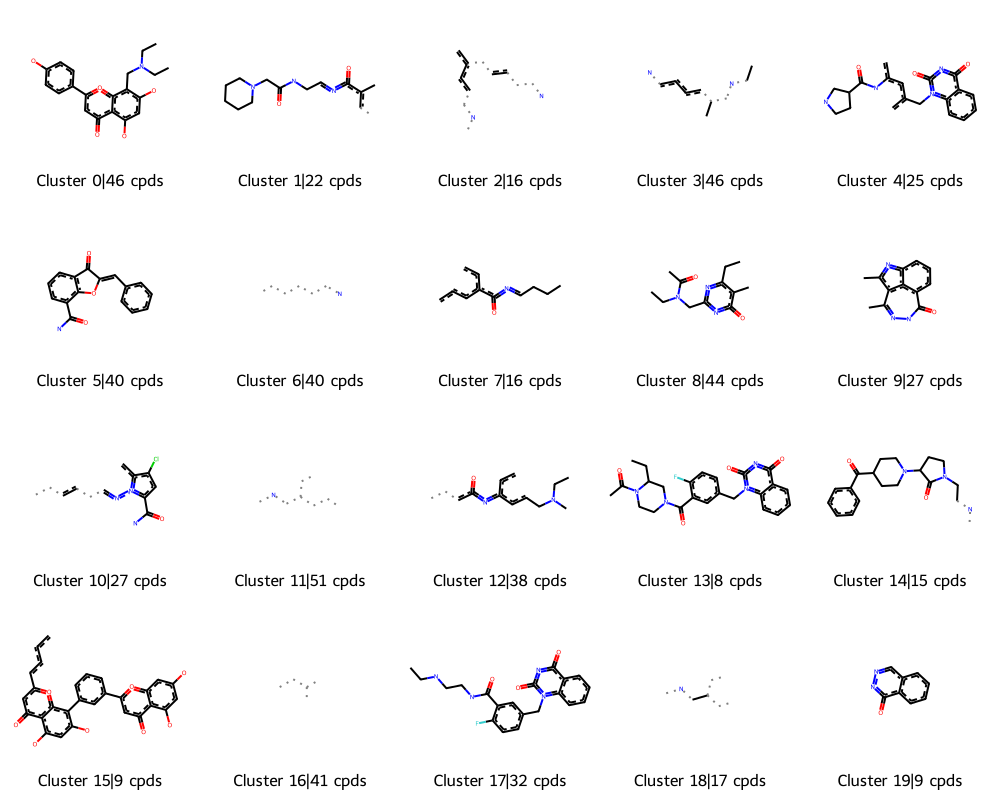

In [4]:
mcs_dict={}
#for each cluster, find the MCS and add it to the mcs_dict
for cluster_id in range(n_clusters):
    cluster_df = umap_df[umap_df['Cluster'] == cluster_id]
    cluster_mols=list(cluster_df['Mol'])
    mcs = Chem.rdFMCS.FindMCS(cluster_mols)
    mcs_smarts = mcs.smartsString
    mcs_mol = Chem.MolFromSmarts(mcs_smarts)
    mcs_dict[f'Cluster {cluster_id}|{len(cluster_mols)} cpds']=mcs_mol

#Show the structures of the MCS
Draw.MolsToGridImage(mcs_dict.values(), legends= mcs_dict.keys(),molsPerRow=5)

Preview the compounds from a specified cluster

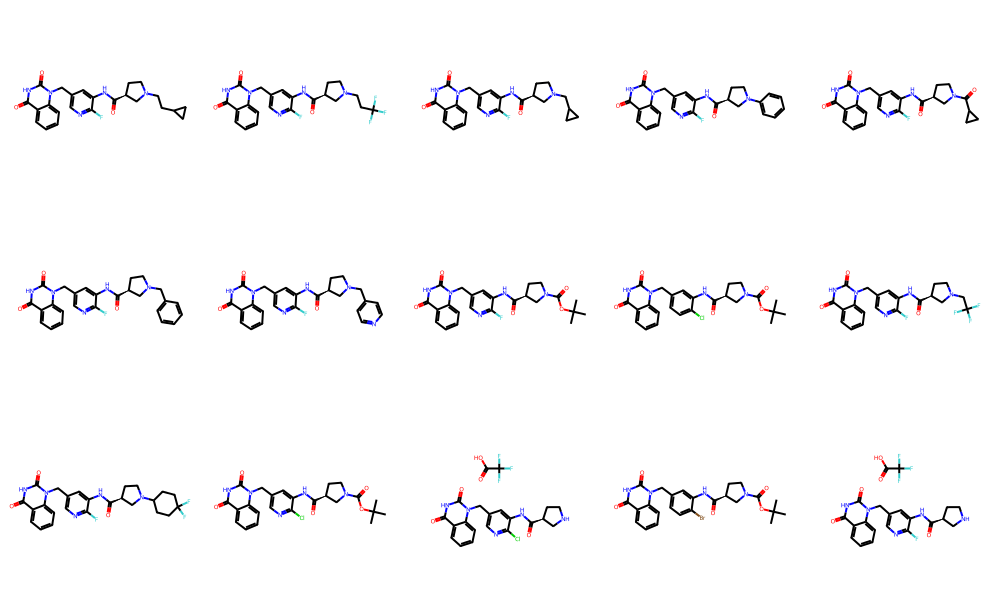

In [6]:
#Specfify the cluster number to show compounds for
cluster_id=4

#Select the cluster results from the umap_df
cluster_df = umap_df[umap_df['Cluster'] == cluster_id]
selected_mols=cluster_df['Mol']

#Show the first 25 compounds from the selected cluster
Draw.MolsToGridImage(selected_mols[:15], molsPerRow=5)

Plot the umap results with interactive tooltips

In [7]:
from bokeh.io import output_notebook
from bokeh.plotting import figure, show, output_file
from bokeh.models import TabPanel, Tabs
from bokeh.models import ColorBar

# Initiate notebook outputs with bokeh
## Note: for large numbers of compounds, the output filesize seems to be too large for display in Colab
## You will need to download the HTML file locally for viewing
output_notebook()

plot_df = umap_df.copy(deep=True)
#Drop incompatable RDKit columns from the umap_df
plot_df = plot_df.drop('Mol', axis=1)
plot_df = plot_df.drop('Mol_Fingerprint', axis=1)

#Assign the data source to use for bokeh
source = ColumnDataSource(plot_df)

#Define the color mappers and color bars used for plotting
# Create color mapper1 for the umap cluster groups
mapper1 = linear_cmap(field_name='Cluster',
                     palette=Turbo256,
                     low=min(kmeans_labels),
                     high=max(kmeans_labels))

# Create color mapper2 for the IC50 values
mapper2 = linear_cmap(field_name='pIC50',
                     palette=Inferno256,
                     low=min(pIC50_labels),
                     high=max(pIC50_labels))

# Define the color bar legend for mapper2
color_bar2 = ColorBar(color_mapper=mapper2['transform'],
                     label_standoff=12, border_line_color=None, location=(0,0), title='pIC50')

# Create color mapper3 for the delta pIC50 values
mapper3 = linear_cmap(field_name='delta pIC50',
                     palette=Inferno256,
                     low=min(delta_pIC50),
                     high=max(delta_pIC50))

# Define the color bar legend for mapper3
color_bar3 = ColorBar(color_mapper=mapper3['transform'],
                     label_standoff=12, border_line_color=None, location=(0,0), title='delta')

# Create tooltips referencing stored images, cluster group, and IC50
TOOLTIPS = """\
    <div>
        <div>
            @imgs{safe}
        </div>
        <div>
            <span>@ID{safe}</span>
        </div>
        <div>
            <span>@Cluster{safe}</span>
        </div>
        <div>
            <span>@IC50{safe}</span>
        </div>
    </div>
"""
#Create 3 tabs for the bokeh plot
#Create scatter plot for umap clusters according to cluster (Tab1)
p1 = figure(width=1000, height=1000, title='UMAP Clustering of SMILES Fingerprints')
p1.circle('UMAP1', 'UMAP2', source=source, size=10, color=mapper1, legend_field='Cluster')
p1.xaxis.axis_label = "UMAP1"
p1.yaxis.axis_label = "UMAP2"
p1.add_tools(HoverTool(tooltips=TOOLTIPS))#Add tools to the plot
p1.legend.visible=False

#Create scatter plot for umap clusters according to pIC50 (Tab2)
p2 = figure(width=1000, height=1000, title='UMAP Clustering of SMILES Fingerprints')
p2.circle('UMAP1', 'UMAP2', source=source, size=10, color=mapper2)
p2.xaxis.axis_label = "UMAP1"
p2.yaxis.axis_label = "UMAP2"
p2.add_layout(color_bar2, "right") #Add the color bar legend
p2.add_tools(HoverTool(tooltips=TOOLTIPS)) # Connect tooltips to plot

#Create scatter plot for umap clusters according to delta pIC50 (Tab3)
p3 = figure(width=1000, height=1000, title='UMAP Clustering of SMILES Fingerprints')
p3.circle('UMAP1', 'UMAP2', source=source, size=10, color=mapper3)
p3.xaxis.axis_label = "UMAP1"
p3.yaxis.axis_label = "UMAP2"
p3.add_layout(color_bar3, "right") #Add the color bar legend
p3.add_tools(HoverTool(tooltips=TOOLTIPS)) # Connect tooltips to plot

#Define the bokeh tabs
tab1 = TabPanel(child=p1, title="Clusters")
tab2 = TabPanel(child=p2, title="pIC50")
tab3 = TabPanel(child=p3, title="delta pIC50")

# Output the plot to an HTML file
output_file("UmapActivityCliffPlot.html")

# Show figure
show(Tabs(tabs=[tab1, tab2, tab3]))

Calculate Structure-Activity Landscape (SAL) Pairs

In [8]:
from rdkit import DataStructs
from rdkit.Chem import PandasTools
from rdkit.Chem.Draw import MolsToGridImage
from ipywidgets import interact
from tqdm.notebook import tqdm

#Define lists for smiles, fingerprints, and pIC50
pIC50_list = data_df.pIC50.values
smiles_list = data_df.Smiles.values
fp_list = data_df.Mol_Fingerprint.values

#Calculate a list of SAL values using pIC50 and Tanimoto similarity
sal_list = []
for i,fp in enumerate(data_df.Mol_Fingerprint):
    sim_list = DataStructs.BulkTanimotoSimilarity(fp,fp_list)
    for j in range(0,i):
        ii,jj = i,j
        if pIC50_list[i] >= pIC50_list[j]: #this ensures the compound with the lower IC50 is always on the left
            ii,jj = i,j
        else:
            jj,ii = i,j
        delta = abs(pIC50_list[i]-pIC50_list[j])
        sim = sim_list[j]
        sal_list.append([ii,jj,sim,delta/(1-sim+0.001),smiles_list[ii],smiles_list[jj],pIC50_list[ii],pIC50_list[jj]])

#Create a dataframe for holding the SAL results
sal_df = pd.DataFrame(sal_list,columns=["i","j","Sim","SAL","SMILES_i","SMILES_j","pIC50_i","pIC50_j"])

#Sort the sal_df according to the best SAL values and take the top 100
sal_df.sort_values("SAL",ascending=False,inplace=True)
sal_df = sal_df.head(100)

#Add the SAL mol pairs to the sal_df
PandasTools.AddMoleculeColumnToFrame(sal_df,"SMILES_i","Mol_i")
PandasTools.AddMoleculeColumnToFrame(sal_df,"SMILES_j","Mol_j")

#Define a function that will align the SAL mol pairs to a MCS
def align_mols(df):
    mcs_list = []
    for idx, [mol_i,mol_j] in tqdm(df[["Mol_i","Mol_j"]].iterrows(),total=df.shape[0]):
        mcs = rdFMCS.FindMCS([mol_i, mol_j],completeRingsOnly=True)
        mcs_smarts = Chem.MolFromSmarts(mcs.smartsString)
        AllChem.Compute2DCoords(mcs_smarts)
        AllChem.GenerateDepictionMatching2DStructure(mol_i,mcs_smarts)
        AllChem.GenerateDepictionMatching2DStructure(mol_j,mcs_smarts)

#Perform the MCS alignment
align_mols(sal_df)

#Preview the sal_df
sal_df.head()

  0%|          | 0/100 [00:00<?, ?it/s]

,i,j,Sim,SAL,SMILES_i,SMILES_j,pIC50_i,pIC50_j,Mol_i,Mol_j
31669,43,252,1.0,2187.086643,N#Cc1ccc(N2CCN([C@H]3C=C(c4cc5c(N)cc(F)cc5c(=O...,N#Cc1ccc(N2CCN([C@@H]3C=C(c4cc5c(N)cc(F)cc5c(=...,5.886057,3.698970,<rdkit.Chem.rdchem.Mol object at 0x7c47874f3ca0>,<rdkit.Chem.rdchem.Mol object at 0x7c477c5f9000>
30926,50,249,1.0,2046.625212,N#Cc1ccc(N2CCN([C@H]3C=C(c4cc5c(N)cccc5c(=O)[n...,N#Cc1ccc(N2CCN([C@@H]3C=C(c4cc5c(N)cccc5c(=O)[...,5.823909,3.777284,<rdkit.Chem.rdchem.Mol object at 0x7c47874f3760>,<rdkit.Chem.rdchem.Mol object at 0x7c477c5f9070>
19942,42,200,1.0,1689.050939,CC[C@@H]1CN(C(=O)c2cc(Cn3c(=O)[nH]c(=O)c4ccccc...,CC[C@H]1CN(C(=O)c2cc(Cn3c(=O)[nH]c(=O)c4ccccc4...,5.906578,4.217527,<rdkit.Chem.rdchem.Mol object at 0x7c47874f30d0>,<rdkit.Chem.rdchem.Mol object at 0x7c477c5f90e0>
19566,63,198,1.0,1348.454646,N#Cc1ccc(N2CCN([C@H]3C=C(c4cc5c(N)cc(F)cc5c(=O...,N#Cc1ccc(N2CCN([C@@H]3C=C(c4cc5c(N)cc(F)cc5c(=...,5.585027,4.236572,<rdkit.Chem.rdchem.Mol object at 0x7c47874f2c70>,<rdkit.Chem.rdchem.Mol object at 0x7c477c5f9150>
2928,2,77,1.0,1311.753861,Cn1ncnc1[C@H]1c2n[nH]c(=O)c3cc(F)cc(c23)N[C@@H...,Cn1ncnc1[C@@H]1c2n[nH]c(=O)c3cc(F)cc(c23)N[C@H...,6.698970,5.387216,<rdkit.Chem.rdchem.Mol object at 0x7c47874f2e30>,<rdkit.Chem.rdchem.Mol object at 0x7c477c5f91c0>


Show the Top 100 SAL pairs

In [9]:

#Show a ipywidget to display the top 100 SAL results side by side
@interact(row_num=(0,99,1)) #control with a slider
def show_pair(row_num=0):
    row = sal_df.iloc[row_num]
    mol_i = row.Mol_i
    mol_j = row.Mol_j
    i = row.i
    j = row.j
    legends = [f"{umap_df.iloc[i].ID} | {umap_df.iloc[i]['IC50']:.2f}",f"{umap_df.iloc[j].ID} | {umap_df.iloc[j]['IC50']:.2f}"]
    print(umap_df.iloc[i].ID,i)
    print(umap_df.iloc[j].ID,j)
    print(f"SAL = {row.SAL:.2f}")
    print(f"Tanimoto = {row.Sim:.2f}")
    delta = 10**(abs(row.pIC50_i-row.pIC50_j))
    print(f"Delta = {delta:.1f}")
    return MolsToGridImage([mol_i,mol_j],molsPerRow=2,subImgSize=(300, 300),legends=legends)


interactive(children=(IntSlider(value=0, description='row_num', max=99), Output()), _dom_classes=('widget-inte…

In [ ]:

sal_df.head()

,i,j,Sim,SAL,SMILES_i,SMILES_j,pIC50_i,pIC50_j,Mol_i,Mol_j
685065,30,1171,1.0,1994.429299,CC[C@@H]1CN(C(=O)c2cc(Cn3c(=O)[nH]c(=O)c4ccccc...,CC[C@H]1CN(C(=O)c2cc(Cn3c(=O)[nH]c(=O)c4ccccc4...,6.292430,4.298001,<rdkit.Chem.rdchem.Mol object at 0x78a4e9ec6960>,<rdkit.Chem.rdchem.Mol object at 0x78a4e9ec4510>
460345,25,960,1.0,1828.317860,CCc1cc2ncc(CN3CC[C@@H](Nc4ccc(C(=O)NC)nc4)C3)c...,CCc1cc2ncc(CN3CC[C@H](Nc4ccc(C(=O)NC)nc4)C3)cc...,6.309804,4.481486,<rdkit.Chem.rdchem.Mol object at 0x78a4e9ec6570>,<rdkit.Chem.rdchem.Mol object at 0x78a4e9ec47b0>
1179028,148,1536,1.0,1815.475573,Cn1ccnc1C1c2n[nH]c(=O)c3cccc(c23)NC1c1ccc(F)cc1,Cn1ccnc1[C@@H]1c2n[nH]c(=O)c3cccc(c23)N[C@H]1c...,5.681937,3.866461,<rdkit.Chem.rdchem.Mol object at 0x78a4e9ec74c0>,<rdkit.Chem.rdchem.Mol object at 0x78a4e9ec4820>
1179038,158,1536,1.0,1781.356390,Cn1ccnc1[C@H]1c2n[nH]c(=O)c3cccc(c23)N[C@@H]1c...,Cn1ccnc1[C@@H]1c2n[nH]c(=O)c3cccc(c23)N[C@H]1c...,5.647817,3.866461,<rdkit.Chem.rdchem.Mol object at 0x78a4e9ec7a70>,<rdkit.Chem.rdchem.Mol object at 0x78a4e9ec4ac0>
809733,105,1273,1.0,1673.866366,Cn1ncnc1[C@H]1c2n[nH]c(=O)c3cccc(c23)N[C@@H]1c...,Cn1ncnc1[C@@H]1c2n[nH]c(=O)c3cccc(c23)N[C@H]1c...,5.835647,4.161781,<rdkit.Chem.rdchem.Mol object at 0x78a4e9ec7df0>,<rdkit.Chem.rdchem.Mol object at 0x78a4e9ec4d60>


Perform Structural analysis on a specific umap cluster

In [10]:
import pandas as pd
import plotly.graph_objects as go
import rdkit.Chem.Descriptors as Descriptors

from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import DataStructs
from global_chem import GlobalChem


gc = GlobalChem()
gc.build_global_chem_network()

cluster_df=umap_df.loc[umap_df['Cluster'] == 1]
PARP_molecules=cluster_df['Smiles'].to_list()


def convert_to_fp(smiles):
    try:
        molecule = Chem.MolFromSmiles(smiles)
        fp = AllChem.GetMorganFingerprintAsBitVect(molecule,2,nBits=1024,)
        return fp
    except:
        return None

#Create names, smiles, and fingerprints using globalchem "rings in drugs"
ring_names=list(gc.get_node_smiles('rings_in_drugs').keys())
ring_smiles=list(gc.get_node_smiles('rings_in_drugs').values())



ring_FPs=[ convert_to_fp(value) for value in ring_smiles ]
ring_dict=dict(zip(ring_names,ring_smiles))



#Define variables to store molecular properties
FG_dict={'methanol': 1,'acid': 2,'thio': 3,'halogen': 4}
key = 0
ID_list=[]
Smiles_list=[]
logp_values = []
number_of_rings_values = []
molecular_weight_values = []
aromatic_values = []
functional_group_values = []
functional_group_keys = {}


#Calculate molecular properties
for molecule in PARP_molecules:
    #Convert smiles to mol
    parp_molecule = Chem.MolFromSmiles(molecule)

    #Calculate the Molecular Descriptors
    aromatic_pattern = Chem.MolFromSmarts('a:a:a') #Define current aromatic pattern used in the input smiles
    logp = Descriptors.MolLogP(parp_molecule)
    molecular_weight = Descriptors.ExactMolWt(parp_molecule)
    num_of_rings = Chem.rdMolDescriptors.CalcNumRings(parp_molecule)
    is_aromatic = parp_molecule.HasSubstructMatch(aromatic_pattern)

    #Set aromaticity value
    is_aromatic_value = 0
    if is_aromatic:
      is_aromatic_value = 1

    #Append descriptors to lists
    logp_values.append(logp)
    number_of_rings_values.append(num_of_rings)
    molecular_weight_values.append(molecular_weight)
    aromatic_values.append(is_aromatic_value)

    # Functional Group Diversity
    fingerprint = convert_to_fp(molecule)
    tanimoto_scores = DataStructs.BulkTanimotoSimilarity(fingerprint, ring_FPs) #Calculate similarites between molecule and all the refrence rings
    functional_group = ring_names[tanimoto_scores.index(max(tanimoto_scores))]

    if functional_group not in functional_group_keys:
        functional_group_keys[functional_group] = key
        functional_group_values.append(key)
        key += 1
    else:
        functional_group_values.append(functional_group_keys[functional_group])


#Create the df to hold the molecule properties
molecule_df = pd.DataFrame()

# Add the properties to the dataframe
molecule_df['logp'] = logp_values
molecule_df['num_of_rings'] = number_of_rings_values
molecule_df['molecular_weight'] = molecular_weight_values
molecule_df['aromatic'] = aromatic_values
molecule_df['functional_group'] = functional_group_values

molecule_df.head(10)

,logp,num_of_rings,molecular_weight,aromatic,functional_group
0,1.86840,4,438.226705,1,0
1,1.99890,4,426.206719,1,1
2,2.23260,5,494.252920,1,1
3,2.23260,5,494.252920,1,2
4,1.66730,4,439.210721,1,1
5,1.84250,5,480.237270,1,2
6,1.84090,4,468.237270,1,1
7,1.84250,4,468.237270,1,1
8,1.36212,4,424.211055,1,1
9,1.07890,4,484.232185,1,0


Visualize the cluster in terms of its molecular properties

In [11]:
fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = molecule_df['logp'],
                   colorscale = [[0,'purple'],[0.5,'lightseagreen'],[1,'gold']],
                   showscale = True,
                   cmin = min(logp_values),
                   cmax = max(logp_values)),
        dimensions = list([
             dict(tickvals = [0, 1],
                 ticktext = ['No', 'Yes'],
                 label = 'Aromatic', values = molecule_df['aromatic']),
            dict(range = [min(number_of_rings_values), max(number_of_rings_values)],
                 tickvals = [i for i in range(min(number_of_rings_values), (max(number_of_rings_values)+1))],
                 label = 'Number of Rings', values = molecule_df['num_of_rings']),
            dict(range = [min(molecular_weight_values), max(molecular_weight_values)],
                 label = 'Molecular Weight', values = molecule_df['molecular_weight']),

            dict(tickvals = list(functional_group_keys.values()),
                 ticktext = list(functional_group_keys.keys()),
                 label = 'Functional Group', values = molecule_df['functional_group']),
            ])
    )
)

fig.update_layout(
            height=1000,
            width=1000,
            grid= dict(columns=1, rows=1)
        )

fig.show()

Construct a cluster plot colored according to the diffrence in IC50 for PARP1 and PARP1

In [12]:
from scipy.optimize._lsq import common
#Compare Parp1 and Parp2 Data

# Specify a csv containing "Smiles" and "IC50" data and the number of umap clusters to produce
parp1_data='https://raw.githubusercontent.com/wkweigel/NotebookExamples/main/Datasets/CHEMBL%20PARP1%20Cpds.csv'

parp2_data='https://raw.githubusercontent.com/wkweigel/NotebookExamples/main/Datasets/ChEMBL%20PARP2%20Cpds.csv'

n_clusters = 20

# Load the dataset with smiles and IC50 values into a pandas DataFrame
parp1_df = pd.read_csv(parp1_data)
parp2_df = pd.read_csv(parp2_data)


#Remove duplicate smiles entries (Common in ChEMBL datasets)
before_rows = parp1_df.shape[0]
parp1_df.drop_duplicates("Smiles",inplace=True)
after_rows = parp1_df.shape[0]
print(f"{before_rows} parp1 rows reduced to {after_rows} rows")

#Remove duplicate smiles entries (Common in ChEMBL datasets)
before_rows = parp2_df.shape[0]
parp2_df.drop_duplicates("Smiles",inplace=True)
after_rows = parp2_df.shape[0]
print(f"{before_rows} parp2 rows reduced to {after_rows} rows")

# Find smiles that are present in both PARP1 and PARP2 datasets
parp1_smiles=list(parp1_df["Smiles"])
parp2_smiles=list(parp2_df["Smiles"])

common_smiles=list(set(parp1_smiles) & set(parp2_smiles))
print(f"{len(common_smiles)} common entries")

# Create a df for the common smiles entries
common_ID=[]
IC50_parp1=[]
IC50_parp2=[]
delta_IC50=[]

for smi in common_smiles:
    ID=parp1_df.loc[parp1_df.Smiles==smi,'Molecule ChEMBL ID'].values[0]
    parp1_IC50=parp1_df.loc[parp1_df.Smiles==smi,'IC50'].values[0]
    parp2_IC50=parp2_df.loc[parp2_df.Smiles==smi,'IC50'].values[0]
    common_ID.append(ID)
    IC50_parp1.append(parp1_IC50)
    IC50_parp2.append(parp2_IC50)
    delta_IC50.append(abs(parp1_IC50-parp2_IC50))

common_df = pd.DataFrame({'Smiles': common_smiles,
                          'ID': common_ID,
                        'Parp1 IC50': IC50_parp1,
                        'Parp2 IC50': IC50_parp2})

# Add mols and fingerprints to the common_df
molecules=[]
fingerprints=[]
def smiles_to_mol_and_fp(smiles):
    mol = Chem.MolFromSmiles(smiles)
    molecules.append(mol)
    fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=2048)
    fingerprints.append(fp)

# Convert smiles to mols and fingerprints and add them to the data df
for smiles in common_df['Smiles']:
    smiles_to_mol_and_fp(smiles)

common_df['Mol'] = molecules
common_df['Mol_Fingerprint'] = fingerprints

# Perform UMAP dimensionality reduction of the fingerprints
reducer = umap.UMAP(n_components=2)
umap_result = reducer.fit_transform(fingerprints)

# Perform K-Means clustering on the umap results
kmeans = KMeans(n_clusters=n_clusters)
kmeans_labels = kmeans.fit_predict(umap_result)

# Create a DataFrame with UMAP results and K-Means clusters
common_df['UMAP1'] = umap_result[:, 0]
common_df['UMAP2'] = umap_result[:, 1]
common_df['Cluster'] = kmeans_labels
common_df['delta_parp']=delta_IC50

# Calculate and create a column for pDelta values
pDelta= -np.log10([x*1E-5 for x in common_df['delta_parp'].values])
common_df['pDelta']=pDelta
common_df.pDelta.replace([np.inf, -np.inf], 10, inplace=True)

pDelta_labels=common_df['pDelta']


# Calculate the maximum common substructure (MCS) for each cluster
for cluster_id in range(n_clusters):
    cluster_data = common_df[common_df['Cluster'] == cluster_id]
    cluster_mols=list(cluster_data['Mol'])
    aligned_mols=[]

    # Find the maximum common substructure (MCS) within the cluster
    mcs = Chem.rdFMCS.FindMCS(cluster_mols)
    mcs_smarts = mcs.smartsString
    mcs_mol = Chem.MolFromSmarts(mcs_smarts) # Convert MCS SMARTS to a molecule

    # Align the molecules in the cluster to the MCS
    for mol in cluster_data['Mol']:
        try:
            aligned_mol=AllChem.GenerateDepictionMatching2DStructure(mol, mcs_mol)
        except ValueError:
            aligned_mol=mol
        aligned_mols.append(aligned_mol)
    #Replace unaligned mols with the aligned ones in the umap_df
    common_df['Mol'].mask(common_df['Cluster'] == cluster_id, aligned_mols, inplace=True)

# Create SVGs for each smiles with RDKit
imgs = []
for mol in common_df['Mol']:
    d2d = Chem.Draw.MolDraw2DSVG(150, 150)
    d2d.DrawMolecule(mol)
    d2d.FinishDrawing()
    svg = d2d.GetDrawingText()
    imgs.append(svg)


#Add the img data and delta_pIC50 data to the umap_df
common_df['imgs']=imgs


#Plot the data
from bokeh.io import output_notebook
from bokeh.plotting import figure, show, output_file
from bokeh.models import TabPanel, Tabs
from bokeh.models import ColorBar

# Initiate notebook outputs with bokeh
## Note: for large numbers of compounds, the output filesize seems to be too large for display in Colab
## You will need to download the HTML file locally for viewing
output_notebook()

plot_df = common_df.copy(deep=True)
#Drop incompatable RDKit columns from the umap_df
plot_df = plot_df.drop('Mol', axis=1)
plot_df = plot_df.drop('Mol_Fingerprint', axis=1)

#Assign the data source to use for bokeh
source = ColumnDataSource(plot_df)

#Define the color mappers and color bars used for plotting
# Create color mapper1 for the umap cluster groups
mapper1 = linear_cmap(field_name='Cluster',
                     palette=Turbo256,
                     low=min(kmeans_labels),
                     high=max(kmeans_labels))

# Create color mapper2 for the IC50 values
mapper2 = linear_cmap(field_name='pDelta',
                     palette=Inferno256,
                     low=min(pDelta_labels),
                     high=max(pDelta_labels))

# Define the color bar legend for mapper2
color_bar2 = ColorBar(color_mapper=mapper2['transform'],
                     label_standoff=12, border_line_color=None, location=(0,0), title='delta_parp')



# Create tooltips referencing stored images, cluster group, and IC50
TOOLTIPS = """\
    <div>
        <div>
            @imgs{safe}
        </div>
        <div>
            <span>@ID{safe}</span>
        </div>
        <div>
            <span>@Cluster{safe}</span>
        </div>
        <div>
            <span>@delta_parp{safe}</span>
        </div>
    </div>
"""
#Create 3 tabs for the bokeh plot
#Create scatter plot for umap clusters according to cluster (Tab1)
p1 = figure(width=1000, height=1000, title='UMAP Clustering of SMILES Fingerprints')
p1.circle('UMAP1', 'UMAP2', source=source, size=10, color=mapper1, legend_field='Cluster')
p1.xaxis.axis_label = "UMAP1"
p1.yaxis.axis_label = "UMAP2"
p1.add_tools(HoverTool(tooltips=TOOLTIPS))#Add tools to the plot
p1.legend.visible=False

#Create scatter plot for umap clusters according to pIC50 (Tab2)
p2 = figure(width=1000, height=1000, title='UMAP Clustering of SMILES Fingerprints')
p2.circle('UMAP1', 'UMAP2', source=source, size=10, color=mapper2)
p2.xaxis.axis_label = "UMAP1"
p2.yaxis.axis_label = "UMAP2"
p2.add_layout(color_bar2, "right") #Add the color bar legend
p2.add_tools(HoverTool(tooltips=TOOLTIPS)) # Connect tooltips to plot


#Define the bokeh tabs
tab1 = TabPanel(child=p1, title="Clusters")
tab2 = TabPanel(child=p2, title="delta_PARP")


# Output the plot to an HTML file
output_file("UmapDeltaPARP_plot.html")

# Show figure
show(Tabs(tabs=[tab1, tab2]))


3233 parp1 rows reduced to 2706 rows
730 parp2 rows reduced to 569 rows
536 common entries


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

<ipython-input-12-c14b488f2c76>:86: RuntimeWarning:

divide by zero encountered in log10



In [ ]:
common_df.head()

,Smiles,ID,Parp1 IC50,Parp2 IC50,Mol,Mol_Fingerprint,UMAP1,UMAP2,Cluster,delta_parp,pDelta,pDelta0,imgs
0,CC(C)CC1NCCc2cc(-c3nc4c(C(N)=O)cc(F)cc4[nH]3)sc21,CHEMBL4286332,36.0,219.0,<rdkit.Chem.rdchem.Mol object at 0x7eef5c492a40>,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",14.946320,-0.366151,9,183.0,2.737549,None,<?xml version='1.0' encoding='iso-8859-1'?>\n<...
1,CC[C@H](C)N(Cc1nc2c(c(=O)[nH]1)COCC2)C(=O)CN1C...,CHEMBL3898270,19000.0,19000.0,<rdkit.Chem.rdchem.Mol object at 0x7eef5c4930d0>,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",6.264832,17.480295,2,0.0,0.000000,None,<?xml version='1.0' encoding='iso-8859-1'?>\n<...
2,COc1ccc(C(=O)C2CCN(CC(=O)NCc3cc4c(c(=O)[nH]3)C...,CHEMBL3946751,7500.0,1150.0,<rdkit.Chem.rdchem.Mol object at 0x7eef643f3760>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",13.668163,10.734221,12,6350.0,1.197226,None,<?xml version='1.0' encoding='iso-8859-1'?>\n<...
3,COc1ccc(CN(Cc2nc3c(c(=O)[nH]2)COCC3)C(=O)CN2CC...,CHEMBL3938947,19000.0,19000.0,<rdkit.Chem.rdchem.Mol object at 0x7eef643f3840>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",7.140538,17.309443,2,0.0,0.000000,None,<?xml version='1.0' encoding='iso-8859-1'?>\n<...
4,NC(=O)c1cccc2c1O/C(=C\c1ccc(C(=O)N3CCN(c4ncccn...,CHEMBL4591947,53.7,50.0,<rdkit.Chem.rdchem.Mol object at 0x7eef643f37d0>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",7.437528,-9.851097,7,3.7,4.431798,None,<?xml version='1.0' encoding='iso-8859-1'?>\n<...


In [ ]:
max(common_df['delta_parp'])

941700.0